In [1]:
import sys
sys.path.append("../..")

In [2]:
model_path = 'C:/Users/david/Documents/progetto/SIV/trained_models/moco_18_ski'
backbone = 'resnet18'
dataset = 'skiPose'

# Imports

In [3]:
import os
import torch
import re
import random
from torchvision.io import read_image

import matplotlib.pyplot as plt
import torchvision.transforms as T

## SimSiam method

In [4]:
from model import get_moco_net, select_random_rows

# Clustering

I extract the representations from the trained model and run K means clustering algorithm (number of clusters=8) on these representation. I reduce the dimentionality of the representations with PCA and LDA algorithm and plot the clustering.
For the comparison I use the representations extracted from encoder model (before the projection head) and the representations extracted after the projection head.

## Setup

In [5]:
from dataloaders.datasets import pose_datasets as data

In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [7]:
from torchvision.models.resnet import  ResNet50_Weights, ResNet18_Weights

def get_cluster_data(batch_size, dataset='panoptic', indexes=[2]):

    if backbone == "resnet50":
        transforms = ResNet50_Weights.DEFAULT.transforms()
    elif backbone == "resnet18":
        transforms = ResNet18_Weights.DEFAULT.transforms()
    transforms = T.Compose([T.ToPILImage(), transforms])

    cluster_dataset = data[dataset](transforms, dataset_dir='../../datasets')
    
    if len(indexes) == 1:
        cluster_loader = torch.utils.data.DataLoader(cluster_dataset[indexes[0]], batch_size)
        cluster_dataset = cluster_dataset[indexes[0]]
    else:
        datasets = []
        loaders = []
        for i in indexes:
            datasets.append(cluster_dataset[i])
            loaders.append(torch.utils.data.DataLoader(datasets[-1], batch_size))
        cluster_loader = loaders
        cluster_dataset = datasets

    return cluster_dataset, cluster_loader

In [8]:
from tqdm.auto import tqdm

def forward(self, im_q):
      """
      Input:
          im_q: a batch of query images
          im_k: a batch of key images
      Output:
          embeddings_q, embeddings_k
      """
      # Return embeddings
      return self.module.encoder_q(im_q)

def extract_representations(path, cluster_loader, load=True):
    net = get_moco_net(backbone, dataset).to(device)
    #overriding forward method to return embeddings
    net.forward = forward.__get__(net, type(net))

    if load:
        net.load_state_dict(torch.load(path))

    net.to(device)
    net.eval()

    base = []
    proj = []
    pose = []

    with torch.no_grad():
        for inputs in tqdm(cluster_loader):
            images = inputs['image']
            images = images.to(device)
            e, q = net(images)
            base.append(e)
            proj.append(q)
            pose.append(inputs['poses_3d'])

    return torch.cat(base).cpu().numpy(), torch.cat(proj).cpu().numpy(), torch.cat(pose).cpu().numpy()

In [9]:
from sklearn.cluster import KMeans


def kmeans_algorithm(features, n_clusters=8, random_state=0):
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)
    kmeans.fit(features)

    return kmeans.labels_

In [10]:
#import LDA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
#import PCA
from sklearn.decomposition import PCA

def reduce_dim_LDA(features, labels, n_components=2):
    lda = LDA(n_components=n_components)
    lda.fit(features, labels)

    return lda.transform(features)

def reduce_dim_PCA(features, n_components=2):
    pca = PCA(n_components=n_components)
    pca.fit(features)

    return pca.transform(features)

In [11]:
def plot_clusters(clusters, features, title):
    #use different colors for different clusters, use a color map
    colors = plt.cm.get_cmap('tab20', len(set(clusters)))
    cluster_colors = [colors(c) for c in clusters]

    plt.scatter(features[:, 0], features[:, 1], c=cluster_colors)
    plt.title(title)
    plt.show()

In [12]:
    import numpy as np
    from scipy.spatial import procrustes
    # ---------------------- Custom Distance and Silhouette Functions ----------------------

    def pose_distance(pose1, pose2, align=False):
        """
        Computes the distance between two poses.
        
        Parameters:
        - pose1, pose2: Arrays of shape (n_joints, 3)
        - align: If True, aligns the poses before computing distance using Procrustes analysis
        
        Returns:
        - Mean Euclidean distance between corresponding joints
        """
        if align:
            # Align poses using Procrustes analysis to account for translation, rotation, and scaling
            mtx1, mtx2, disparity = procrustes(pose1, pose2)
            return np.mean(np.linalg.norm(mtx1 - mtx2, axis=1))
        else:
            return np.mean(np.linalg.norm(pose1 - pose2, axis=1))

    matrix_dist = None
    def compute_distance_matrix(poses, align=False):
        """
        Computes the pairwise distance matrix for a set of poses.
        
        Parameters:
        - poses: Array of shape (n_samples, n_joints, 3)
        - align: If True, aligns each pair of poses before computing distance
        
        Returns:
        - distance_matrix: Array of shape (n_samples, n_samples)
        """
        global matrix_dist
        if matrix_dist is not None:
            return matrix_dist

        n_samples = poses.shape[0]
        distance_matrix = np.zeros((n_samples, n_samples))
        
        for i in range(n_samples):
            for j in range(i + 1, n_samples):
                distance = pose_distance(poses[i], poses[j], align=align)
                distance_matrix[i, j] = distance
                distance_matrix[j, i] = distance  # Symmetric matrix
        
        matrix_dist = distance_matrix
        return distance_matrix

    def custom_silhouette_score(poses, labels, align=True):
        """
        Computes a custom silhouette score based on pose similarity.
        
        Parameters:
        - poses: Array of shape (n_samples, n_joints, 3)
        - labels: Array of cluster labels for each sample
        - align: If True, aligns poses before computing distances
        
        Returns:
        - mean_silhouette: The mean silhouette score
        """
        n_samples = poses.shape[0]
        unique_labels = np.unique(labels)
        n_labels = unique_labels.shape[0]
        
        # Compute the distance matrix
        print("Computing pairwise distance matrix for poses...")
        distance_matrix = compute_distance_matrix(poses, align=align)
        
        silhouette_vals = np.zeros(n_samples)
        
        for i in range(n_samples):
            label_i = labels[i]
            
            # Indices of all samples in the same cluster, excluding the current sample
            same_cluster = (labels == label_i)
            same_cluster[i] = False  # Exclude self
            
            if np.sum(same_cluster) == 0:
                a = 0  # Define a as 0 if the sample is the only one in its cluster
            else:
                a = np.mean(distance_matrix[i][same_cluster])
            
            # Compute the average distance to the nearest cluster
            b = np.inf
            for label in unique_labels:
                if label == label_i:
                    continue
                other_cluster = (labels == label)
                if np.sum(other_cluster) == 0:
                    continue
                distance_to_cluster = np.mean(distance_matrix[i][other_cluster])
                if distance_to_cluster < b:
                    b = distance_to_cluster
            
            silhouette_vals[i] = (b - a) / max(a, b) if max(a, b) > 0 else 0
        
        mean_silhouette = np.mean(silhouette_vals)
        return mean_silhouette

In [13]:
import numpy as np
# procrustes analysis
from scipy.spatial import procrustes

def compute_cka(X, Y):
    """
    Computes the Centered Kernel Alignment (CKA) between two matrices X and Y.
    
    Parameters:
    - X: numpy array of shape (n_samples, n_features1)
    - Y: numpy array of shape (n_samples, n_features2)
    
    Returns:
    - cka_value: the CKA similarity between X and Y
    """
    # Center the matrices
    X_centered = X - X.mean(axis=0)
    Y_centered = Y - Y.mean(axis=0)
    
    # Compute the dot products
    X_norm = np.linalg.norm(X_centered, 'fro')
    Y_norm = np.linalg.norm(Y_centered, 'fro')
    
    # Compute the HSIC (Hilbert-Schmidt Independence Criterion)
    hsic = np.trace(np.dot(X_centered.T, Y_centered))
    
    # Compute CKA
    cka = hsic / (X_norm * Y_norm)
    return cka

def align_pose(pose_tensor, dataset_name):
        """
        Aligns the pose to be upright (perpendicular to the floor) and facing the viewer.

        Args:
            pose_tensor (torch.Tensor): Pose tensor of shape (N, 3).
            dataset_name (str): The name of the dataset to determine joint indices.

        Returns:
            torch.Tensor: Aligned pose tensor of shape (N, 3).
        """
        # Center the pose around its mean
        pose_centered = pose_tensor - pose_tensor.mean(dim=0)

        # Define joint indices based on the dataset
        # Adjust these indices according to your dataset's joint definitions
        if dataset_name == "panoptic":
            hip_index = 2
            head_index = 14
            left_shoulder_index = 9
            right_shoulder_index = 3
        elif dataset_name == "skiPose":
            hip_index = 0
            head_index = 14
            left_shoulder_index = 5
            right_shoulder_index = 2
        else:
            # Default indices
            hip_index = 0
            head_index = -1
            left_shoulder_index = 5
            right_shoulder_index = 6

        # Compute the "up" vector (from hips to head)
        if hip_index < len(pose_centered) and head_index < len(pose_centered):
            up_vector = pose_centered[head_index] - pose_centered[hip_index]
        else:
            up_vector = torch.tensor(
                [0, 0, 1], dtype=pose_tensor.dtype, device=pose_tensor.device
            )

        # Normalize the up vector
        up_vector_norm = torch.norm(up_vector)
        if up_vector_norm == 0:
            up_vector = torch.tensor(
                [0, 0, 1], dtype=pose_tensor.dtype, device=pose_tensor.device
            )
        else:
            up_vector = up_vector / up_vector_norm

        # Desired up vector (aligned with Z-axis)
        target_up = torch.tensor(
            [0, 0, 1], dtype=pose_tensor.dtype, device=pose_tensor.device
        )

        # Compute rotation to align up_vector with target_up
        rotation_mat = compute_alignment_rotation(up_vector, target_up)

        # Apply rotation
        pose_aligned = torch.matmul(pose_centered, rotation_mat.T)

        # Rotate around Z-axis to face the viewer
        # Compute the forward vector (from left shoulder to right shoulder)
        if left_shoulder_index < len(pose_aligned) and right_shoulder_index < len(
            pose_aligned
        ):
            forward_vector = (
                pose_aligned[right_shoulder_index] - pose_aligned[left_shoulder_index]
            )
        else:
            forward_vector = torch.tensor(
                [1, 0, 0], dtype=pose_tensor.dtype, device=pose_tensor.device
            )

        # Project forward_vector onto XY-plane
        forward_vector_xy = forward_vector.clone()
        forward_vector_xy[2] = 0
        forward_vector_xy_norm = torch.norm(forward_vector_xy)
        if forward_vector_xy_norm == 0:
            forward_vector_xy = torch.tensor(
                [1, 0, 0], dtype=pose_tensor.dtype, device=pose_tensor.device
            )
        else:
            forward_vector_xy = forward_vector_xy / forward_vector_xy_norm

        # Desired forward direction (Y-axis)
        target_forward = torch.tensor(
            [0, 1, 0], dtype=pose_tensor.dtype, device=pose_tensor.device
        )

        # Compute rotation around Z-axis to align forward_vector_xy with target_forward
        angle_z = torch.atan2(forward_vector_xy[1], forward_vector_xy[0]) - torch.atan2(
            target_forward[1], target_forward[0]
        )
        cos_angle = torch.cos(-angle_z)
        sin_angle = torch.sin(-angle_z)
        rotation_z = torch.tensor(
            [[cos_angle, -sin_angle, 0], [sin_angle, cos_angle, 0], [0, 0, 1]],
            dtype=pose_tensor.dtype,
            device=pose_tensor.device,
        )

        # Apply rotation around Z-axis
        pose_aligned = torch.matmul(pose_aligned, rotation_z.T)

        return pose_aligned

def compute_alignment_rotation(source_vector, target_vector):
        """
        Computes the rotation matrix that aligns source_vector to target_vector.

        Args:
            source_vector (torch.Tensor): Source vector of shape (3,).
            target_vector (torch.Tensor): Target vector of shape (3,).

        Returns:
            torch.Tensor: Rotation matrix of shape (3, 3).
        """
        v = torch.cross(source_vector, target_vector)
        c = torch.dot(source_vector, target_vector)
        s = torch.norm(v)

        if s == 0:
            # Vectors are parallel
            if c > 0:
                # Same direction
                return torch.eye(3, dtype=source_vector.dtype, device=source_vector.device)
            else:
                # Opposite direction
                # Rotate 180 degrees around any orthogonal axis
                orthogonal_axis = torch.tensor(
                    [1, 0, 0], dtype=source_vector.dtype, device=source_vector.device
                )
                if torch.allclose(source_vector, orthogonal_axis):
                    orthogonal_axis = torch.tensor(
                        [0, 1, 0], dtype=source_vector.dtype, device=source_vector.device
                    )
                v = torch.cross(source_vector, orthogonal_axis)
                v = v / torch.norm(v)
                return rotation_matrix_from_axis_angle(v, torch.pi)
        else:
            kmat = torch.tensor(
                [[0, -v[2], v[1]], [v[2], 0, -v[0]], [-v[1], v[0], 0]],
                dtype=source_vector.dtype,
                device=source_vector.device,
            )
            rotation_matrix = (
                torch.eye(3, dtype=source_vector.dtype, device=source_vector.device)
                + kmat
                + kmat @ kmat * ((1 - c) / (s**2))
            )
            return rotation_matrix


def rotation_matrix_from_axis_angle(axis, angle):
        """
        Computes the rotation matrix from an axis and angle using Rodrigues' rotation formula.

        Args:
            axis (torch.Tensor): Rotation axis of shape (3,).
            angle (float): Rotation angle in radians.

        Returns:
            torch.Tensor: Rotation matrix of shape (3, 3).
        """
        K = torch.tensor(
            [[0, -axis[2], axis[1]], [axis[2], 0, -axis[0]], [-axis[1], axis[0], 0]],
            dtype=axis.dtype,
            device=axis.device,
        )

        R = (
            torch.eye(3, dtype=axis.dtype, device=axis.device)
            + torch.sin(angle) * K
            + (1 - torch.cos(angle)) * torch.matmul(K, K)
        )
        return R


def plot_pose(ax, pose, connections, title="", color="r", loss=0):
        """Plots a single pose in a 3D subplot."""
        ax.scatter(pose[:, 0], pose[:, 1], pose[:, 2], c=color)
        for connection in connections:
            start, end = connection
            if start < len(pose) and end < len(pose):
                ax.plot(
                    [pose[start, 0], pose[end, 0]],
                    [pose[start, 1], pose[end, 1]],
                    [pose[start, 2], pose[end, 2]],
                    c=color,
                )
        # write name and loss (in scientific notation)
        ax.set_title(f"{title} - Error {loss:.2E}")
        ax.set_xlabel("X")
        ax.set_ylabel("Y")
        ax.set_zlabel("Z")
        ax.set_xlim(-1, 1)
        ax.set_ylim(-1, 1)
        ax.set_zlim(-1, 1)
        ax.view_init(elev=20, azim=180)  # Adjust view angle for better visualization

from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

def compute_knn_regression_error(train_feat, poses_train, features, poses, n_neighbors=5):
    """
    Computes the k-NN Regression Error (MPJPE) using the features to predict poses.
    
    Parameters:
    - features: numpy array of shape (n_samples, n_features)
    - poses: numpy array of shape (n_samples, n_joints, 3)
    - n_neighbors: number of neighbors to use in k-NN
    
    Returns:
    - mpjpe: Mean Per Joint Position Error
    """
    # Flatten the poses for regression
    poses_flat = poses_train.reshape(poses_train.shape[0], -1)
    
    # Train k-NN regressor
    knn = KNeighborsRegressor(n_neighbors=n_neighbors, metric='cosine', weights='distance')
    knn.fit(train_feat, poses_flat)
    
    # Predict on test set
    y_pred = knn.predict(features)
    
    # Reshape poses back to original shape
    y_pred = y_pred.reshape(-1, poses.shape[1], poses.shape[2])
    y_test = poses
    
    # Compute MPJPE
    mpjpe = np.mean(np.linalg.norm(y_pred - y_test, axis=2))
    return mpjpe


In [14]:
from sklearn.metrics import (
    silhouette_score, adjusted_rand_score, adjusted_mutual_info_score,
    davies_bouldin_score, calinski_harabasz_score, fowlkes_mallows_score,
    homogeneity_completeness_v_measure, f1_score, silhouette_samples
)
from sklearn.manifold import TSNE, trustworthiness
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from scipy.spatial import ConvexHull
from scipy.stats import spearmanr, pearsonr
from sklearn.utils import resample
import numpy as np

import warnings
warnings.filterwarnings("ignore")

def pairwise_distances(X, Y=None):
    """
    Compute pairwise distances between two sets of samples.
    
    Parameters:
    - X: numpy array of shape (n_samples1, n_features)
    - Y: numpy array of shape (n_samples2, n_features)
    
    Returns:
    - distances: numpy array of shape (n_samples1, n_samples2)
    """
    if Y is None:
        Y = X
    return np.linalg.norm(X[:, None] - Y, axis=2)

def dunn_index(X, labels):
    unique_clusters = np.unique(labels)
    n_clusters = len(unique_clusters)
    if n_clusters < 2:
        return np.nan
    # Compute all inter-cluster distances
    inter_dist = []
    for i in unique_clusters:
        for j in unique_clusters:
            if i < j:
                dist = np.min(pairwise_distances(X[labels == i], X[labels == j]))
                inter_dist.append(dist)
    # Compute all intra-cluster distances
    intra_dist = [np.max(pairwise_distances(X[labels == c])) for c in unique_clusters]
    return min(inter_dist) / max(intra_dist)

def evaluate_linear_separability(X, y):
    clf = LogisticRegression(max_iter=1000, multi_class='auto', solver='lbfgs')
    scores = cross_val_score(clf, X, y, cv=5, scoring='accuracy')
    return scores.mean()

def cluster(
    model_path, load=True, n_clusters=8, n_components=2, dataset='panoptic', random_state=0
):
    cluster_set, cluster_loader = get_cluster_data(30, dataset)
    base, proj, poses = extract_representations(model_path, cluster_loader, load)
    poses = np.array([align_pose(torch.tensor(pose), dataset) for pose in poses])
    _, train_loader = get_cluster_data(30, dataset, [0])
    base_train, _, poses_train = extract_representations(model_path, train_loader, load)
    poses_train = np.array([align_pose(torch.tensor(pose), dataset) for pose in poses_train])
    
    labels_base = kmeans_algorithm(base, n_clusters, random_state)
    labels_proj = kmeans_algorithm(proj, n_clusters, random_state)
    
    # Assuming gt_clusters are defined for external metrics
    gt_clusters = kmeans_algorithm(poses.reshape(poses.shape[0], -1), n_clusters, random_state)
    
    print("--------------------------------------------------")
    print("SILHOUETTE SCORES")
    silhouette_base = silhouette_score(base, labels_base)
    print("Silhouette score for the encoder features: {}".format(silhouette_base))
    
    print("--------------------------------------------------")
    print("CUSTOM SILHOUETTE SCORES")
    shilouette_from_3D_poses_base = custom_silhouette_score(poses, labels_base)
    print("Custom silhouette score for encoder features: {}".format(shilouette_from_3D_poses_base))
    
    print("--------------------------------------------------")
    print("SPERMAN CORRELATION")
    pose_distances = compute_distance_matrix(poses, align=True).flatten()
    permuted_indices = np.argsort(pose_distances.flatten())
    pose_distances = pose_distances.flatten()[permuted_indices]
    
    embedding_distances = -np.dot(base, base.T) / (
        np.linalg.norm(base, axis=1) * np.linalg.norm(base, axis=1)[:, None]
    )
    embedding_distances = embedding_distances.flatten()
    embedding_distances = embedding_distances[permuted_indices]
    
    correlation, _ = spearmanr(pose_distances, embedding_distances)
    print("Spearman correlation between pose distances and embedding distances on encoder: {}".format(correlation))
    
    print("--------------------------------------------------")
    print("PEARSON CORRELATION")
    correlation, _ = pearsonr(pose_distances, embedding_distances)
    print("Pearson correlation between pose distances and embedding distances on encoder: {}".format(correlation))
    
    print("--------------------------------------------------")
    print("CKA")
    base_cka = compute_cka(base, poses.reshape(poses.shape[0], -1))
    print("CKA between encoder features and poses: {}".format(base_cka))
    
    print("--------------------------------------------------")
    print("K-NN REGRESSION")
    mpjpe_base = compute_knn_regression_error(base_train, poses_train, base, poses, n_neighbors=5)
    print("k-NN Regression MPJPE using encoder features: {}".format(mpjpe_base))
    
    print("--------------------------------------------------")
    print("Plotting clusters...")
    # t-SNE
    tsne = TSNE(n_components=2, random_state=random_state)
    tsne_base = tsne.fit_transform(base)
    tsne_proj = tsne.fit_transform(proj)
    
    plot_clusters(labels_base, tsne_base, "Encoder features t-SNE")
    if load:
        plot_clusters(labels_proj, tsne_proj, "Projection head features t-SNE")
    
    return cluster_set, base, proj, labels_base, labels_proj


In [15]:
#get the latest model
epoch = 0
for file in os.listdir(model_path):
    if 'epoch' in file:
        e = int(re.findall(r'\d+', file)[0])
        if e > epoch:
            epoch = e

path = model_path + '/epoch_{:d}.pt'.format(epoch)
print(path)

#path="trained_models/siam2.pt"

C:/Users/david/Documents/progetto/SIV/trained_models/moco_18_ski/epoch_30.pt


## Before training

In [16]:
# _, _, _, _, _ = cluster(path, load=False, n_clusters=8, n_components=2, dataset=dataset, random_state=0)

## Trained model
visualization based on the model preprained with 0.0001 learning rate for base encoder

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/227 [00:00<?, ?it/s]

--------------------------------------------------
SILHOUETTE SCORES
Silhouette score for the encoder features: 0.04939999431371689
--------------------------------------------------
CUSTOM SILHOUETTE SCORES
Computing pairwise distance matrix for poses...
Custom silhouette score for encoder features: -0.12756001168721554
--------------------------------------------------
SPERMAN CORRELATION
Spearman correlation between pose distances and embedding distances on encoder: 0.10216216993929209
--------------------------------------------------
PEARSON CORRELATION
Pearson correlation between pose distances and embedding distances on encoder: 0.13626026845838915
--------------------------------------------------
CKA
CKA between encoder features and poses: -0.003677492029964924
--------------------------------------------------
K-NN REGRESSION
k-NN Regression MPJPE using encoder features: 0.10618994211093477
--------------------------------------------------
Plotting clusters...


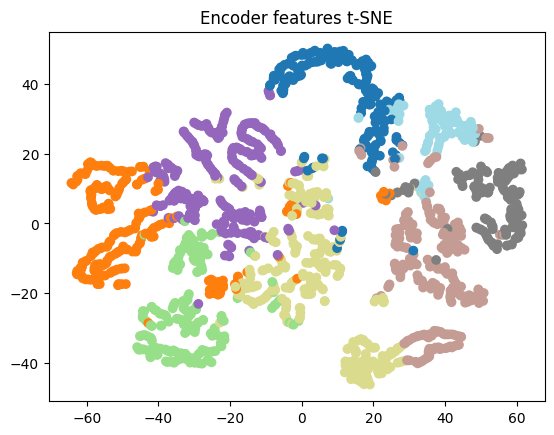

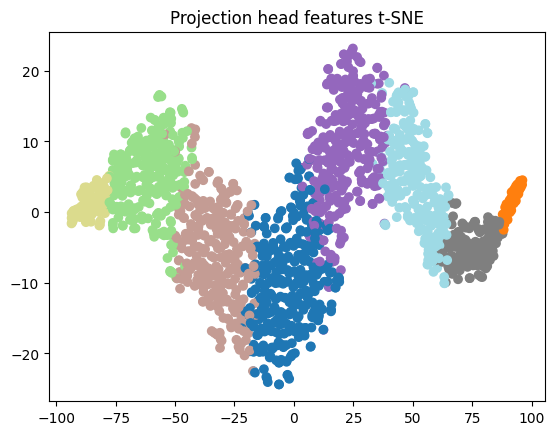

In [17]:
cluster_set, base_features, proj_features, labels_base, labels_proj = cluster(
    path, load=True, n_clusters=8, n_components=2, dataset=dataset, random_state=0
    )

  0%|          | 0/227 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

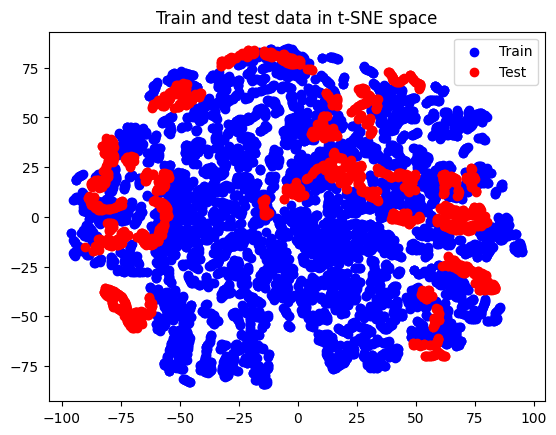

In [18]:
from sklearn.metrics import silhouette_score
from scipy.stats import spearmanr



def cluster_testandTrain(model_path, load=True, n_components=2, dataset='panoptic'):
    cluster_set, cluster_loader = get_cluster_data(30, dataset, [0,2])

    base_features_train, _, _ = extract_representations(model_path, cluster_loader[0], load)
    base_features_test, _, _ = extract_representations(model_path, cluster_loader[1], load)

    # show in the same plot the train and test data with different colors
    both_features = np.concatenate((base_features_train, base_features_test))
    tsne = TSNE(n_components=2, random_state=0)
    tsne_features = tsne.fit_transform(both_features)
    plt.scatter(tsne_features[:base_features_train.shape[0], 0], tsne_features[:base_features_train.shape[0], 1], c='b', label='Train')
    plt.scatter(tsne_features[base_features_train.shape[0]:, 0], tsne_features[base_features_train.shape[0]:, 1], c='r', label='Test')
    plt.title("Train and test data in t-SNE space")
    plt.legend()
    plt.show()

    return cluster_set, base_features_train, base_features_test

_, _, _ = cluster_testandTrain( path, load=True, n_components=2, dataset=dataset)


### Clustering results

In [19]:
def plot_one_cluster(dataset, cluster_ind, labels):
    indexes = [i for i in range(0, len(labels)) if labels[i]==cluster_ind]

    plt.figure(figsize = (10,10))

    for i in range(0, 9):
        ax = plt.subplot(3, 3, i+1)
        image = dataset[indexes[random.randint(0, len(indexes)-1)]]['image'].permute(1, 2, 0)
        # denormalize
        mean = torch.tensor([0.485, 0.456, 0.406])
        std = torch.tensor([0.229, 0.224, 0.225])
        image = std * image + mean
        ax.imshow(image)

    plt.show()

#### Base encoder
Clustering based on features extracted from base encoder

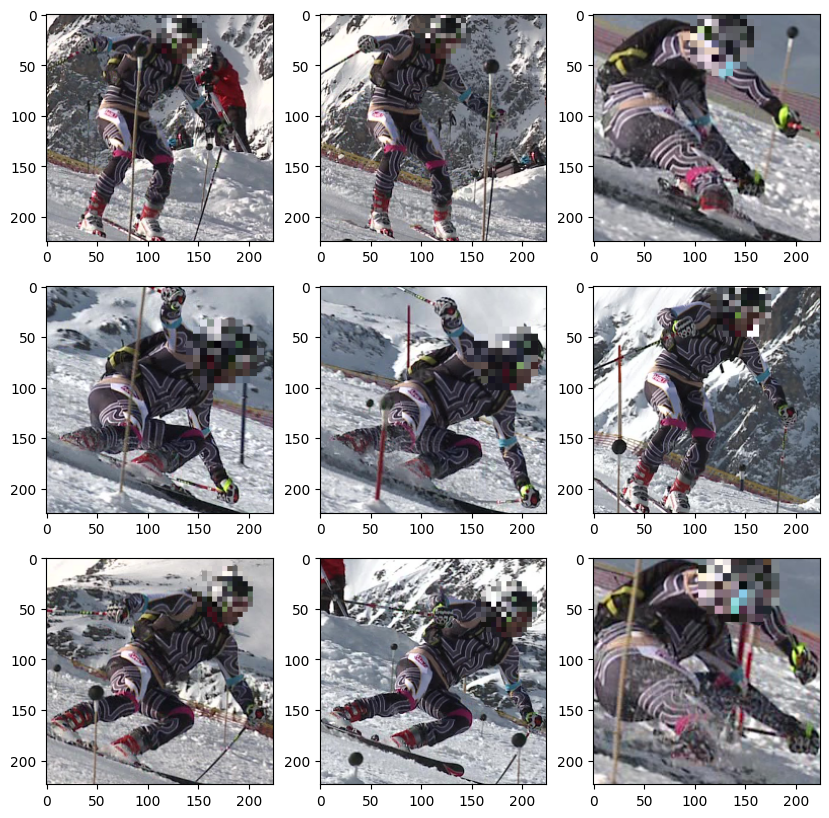

In [20]:
plot_one_cluster(cluster_set, 0, labels_base)

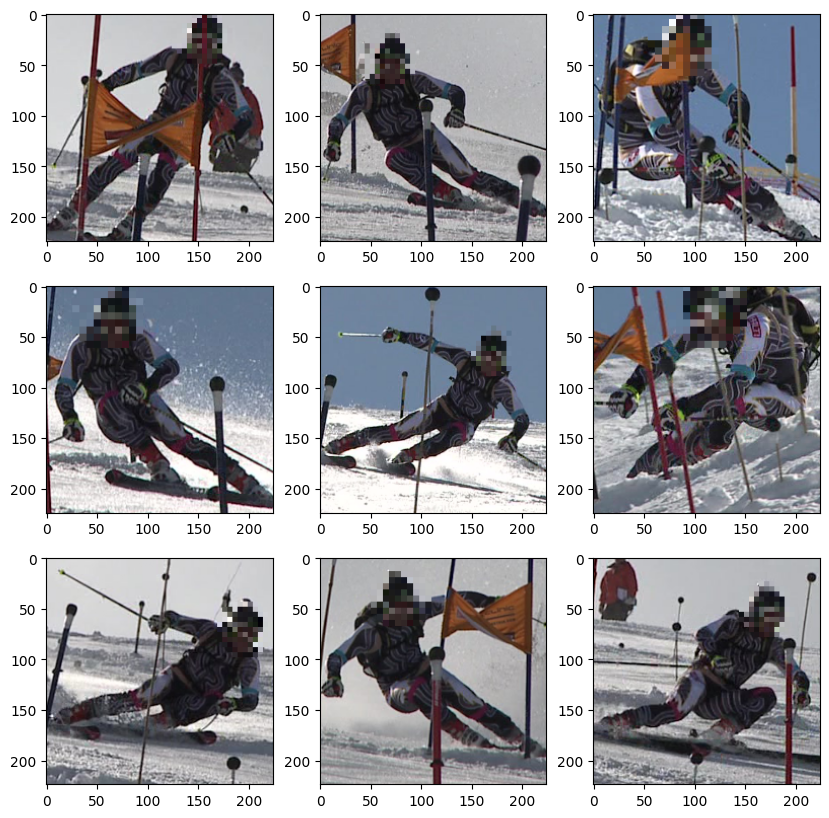

In [21]:
plot_one_cluster(cluster_set, 1, labels_base)

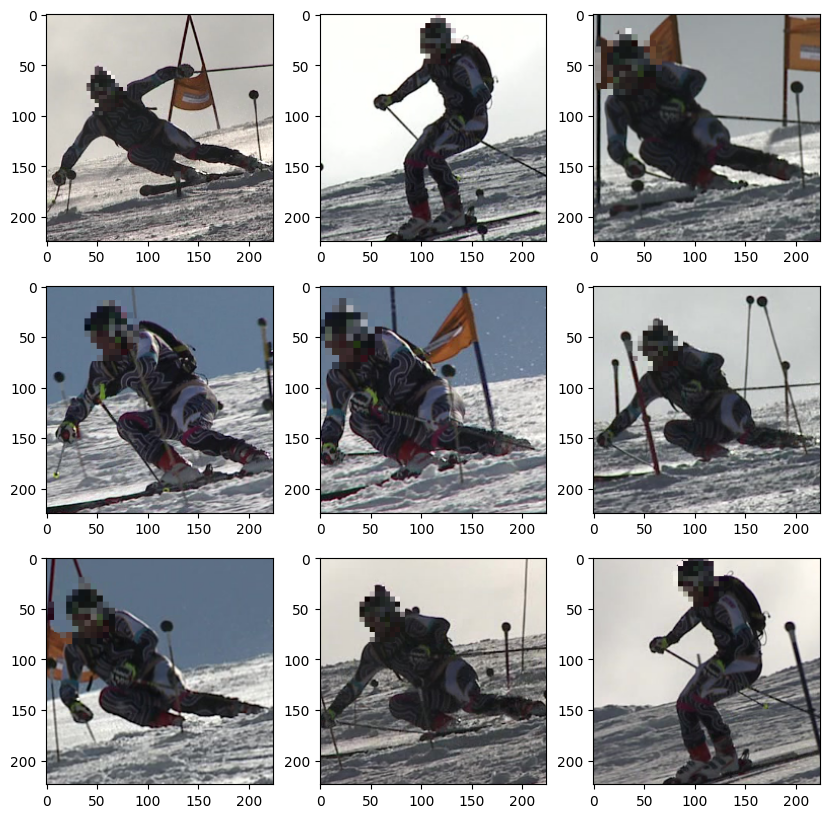

In [22]:
plot_one_cluster(cluster_set, 2, labels_base)

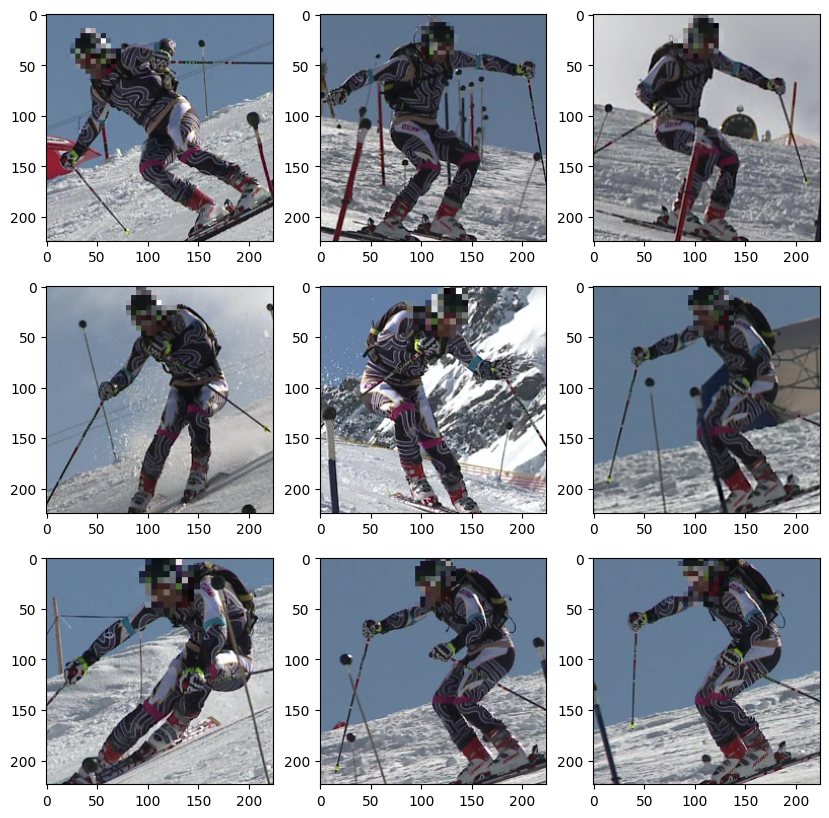

In [23]:
plot_one_cluster(cluster_set, 3, labels_base)

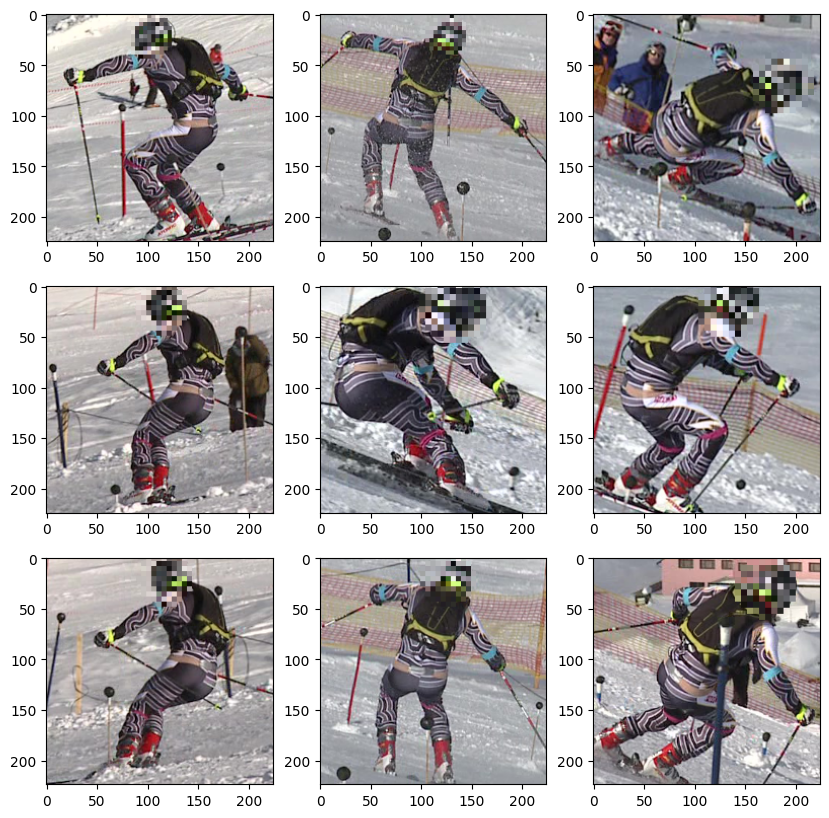

In [24]:
plot_one_cluster(cluster_set, 4, labels_base)

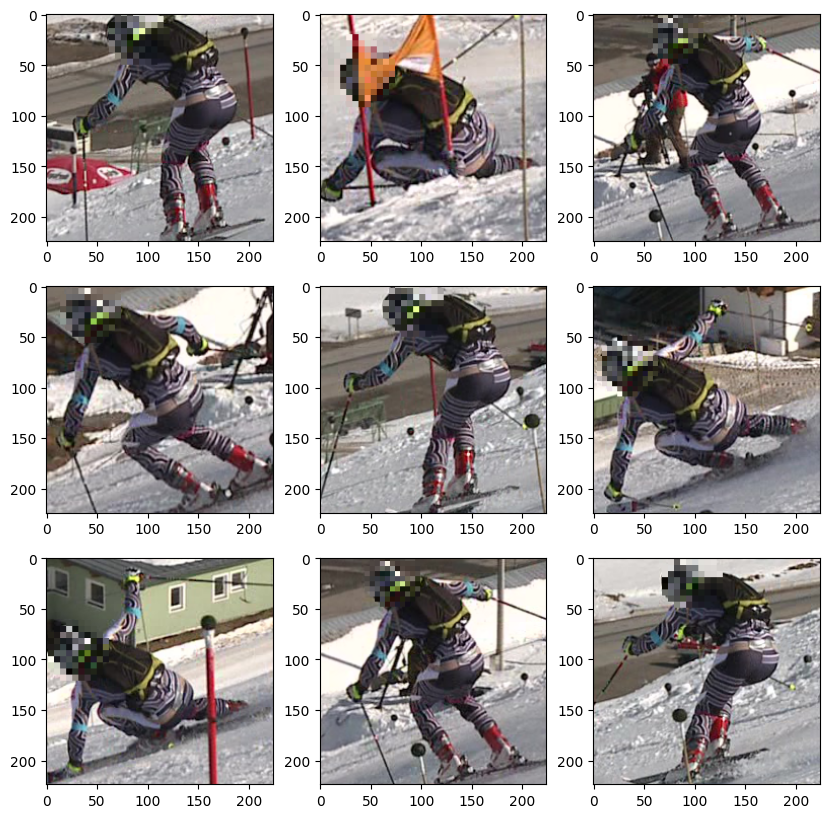

In [25]:
plot_one_cluster(cluster_set, 5, labels_base)

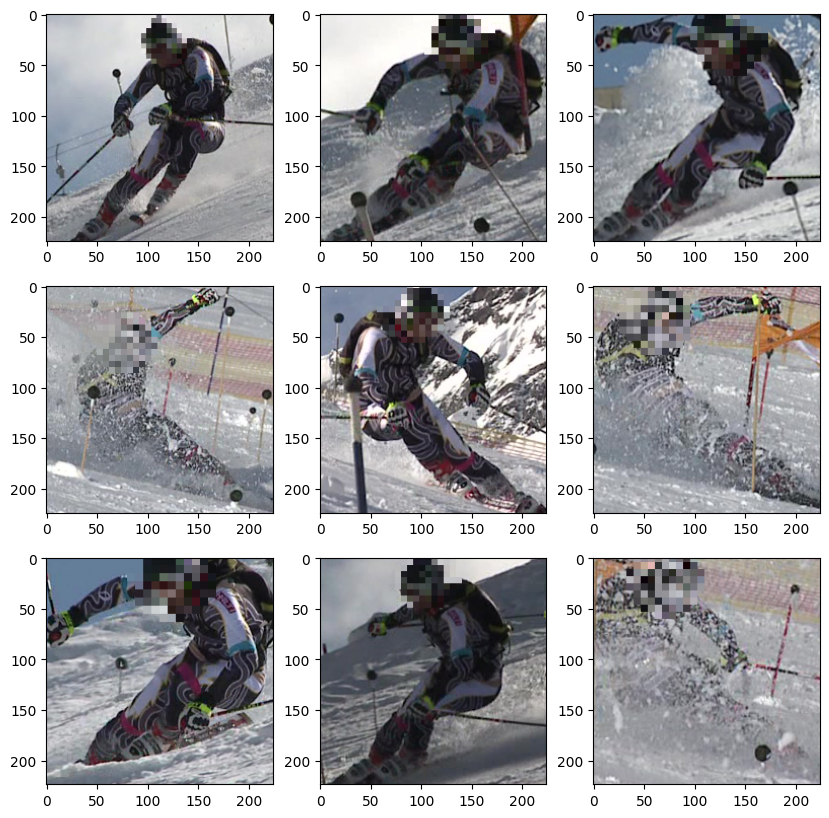

In [26]:
plot_one_cluster(cluster_set, 6, labels_base)

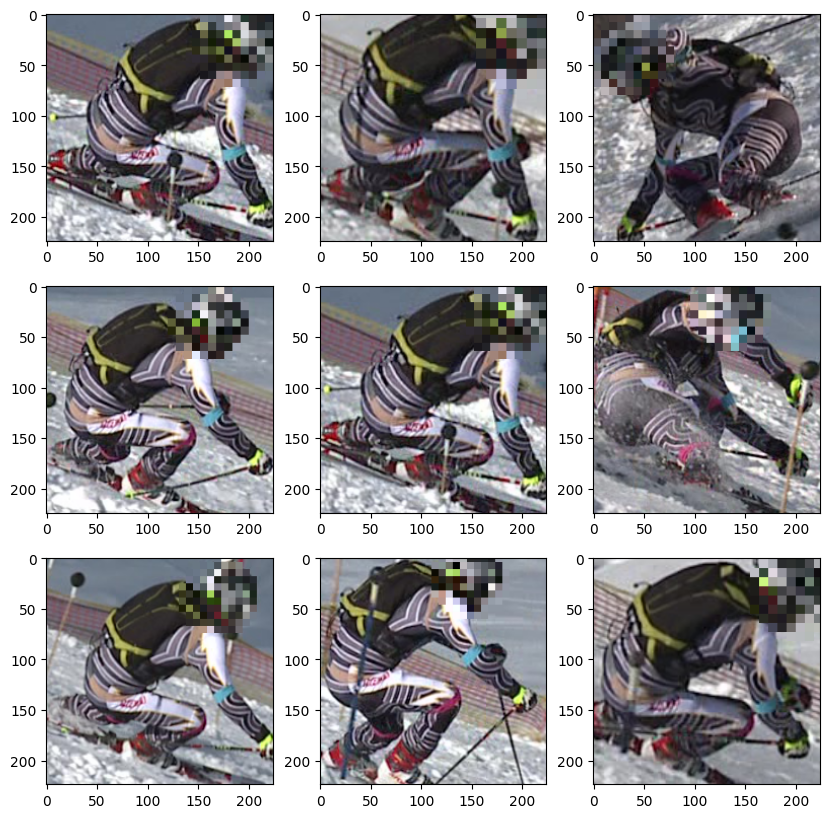

In [27]:
plot_one_cluster(cluster_set, 7, labels_base)

#### Projection head
Clustering based on features extracted from projection head

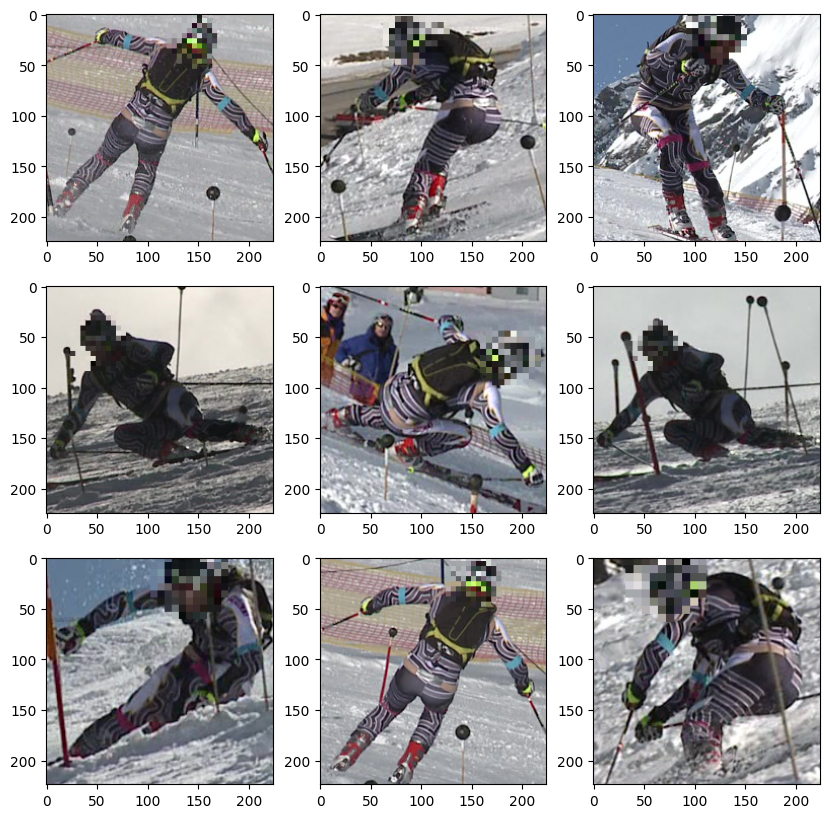

In [28]:
plot_one_cluster(cluster_set, 0, labels_proj)

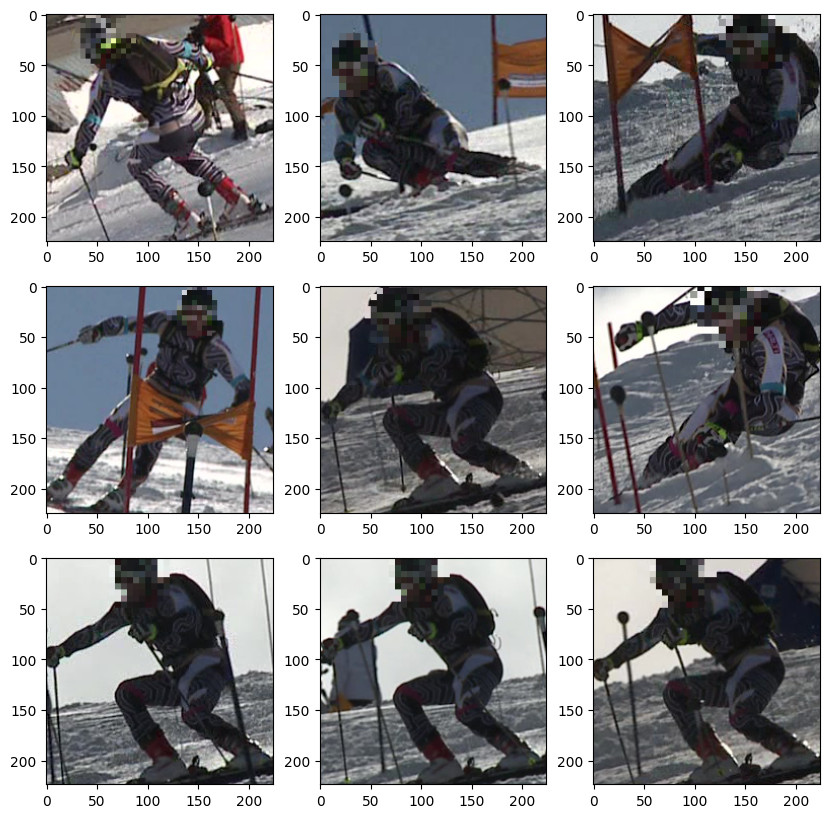

In [29]:
plot_one_cluster(cluster_set, 1, labels_proj)

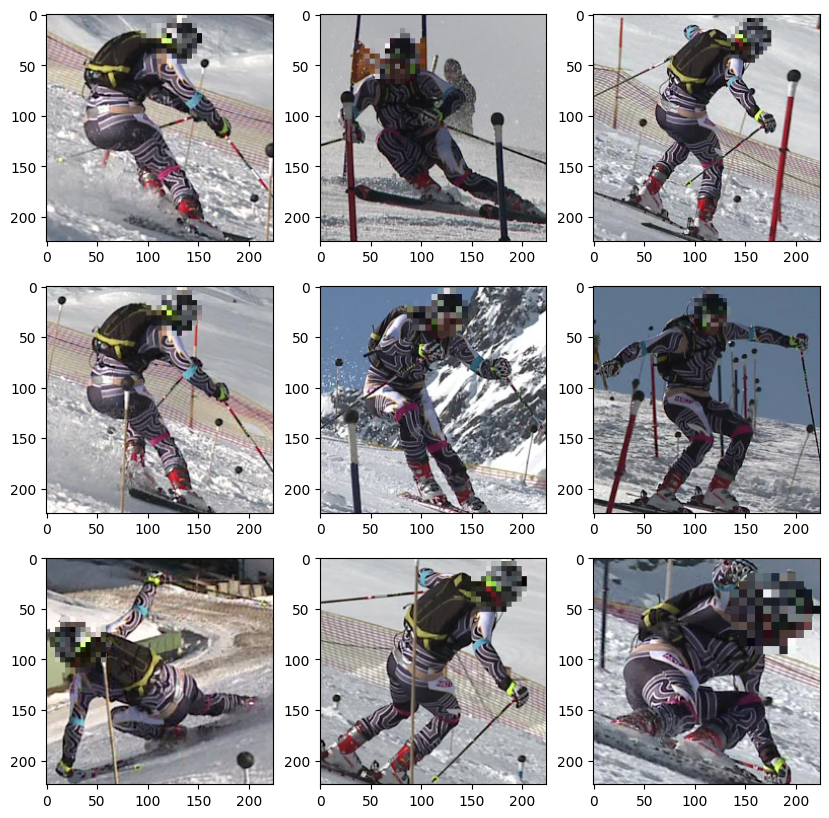

In [30]:
plot_one_cluster(cluster_set, 2, labels_proj)

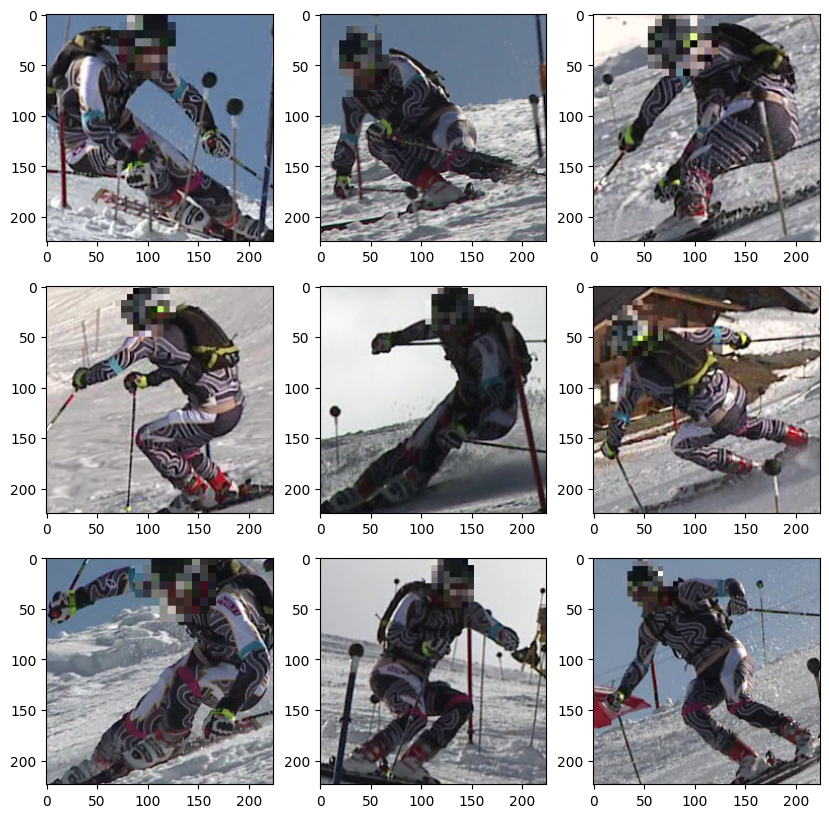

In [31]:
plot_one_cluster(cluster_set, 3, labels_proj)

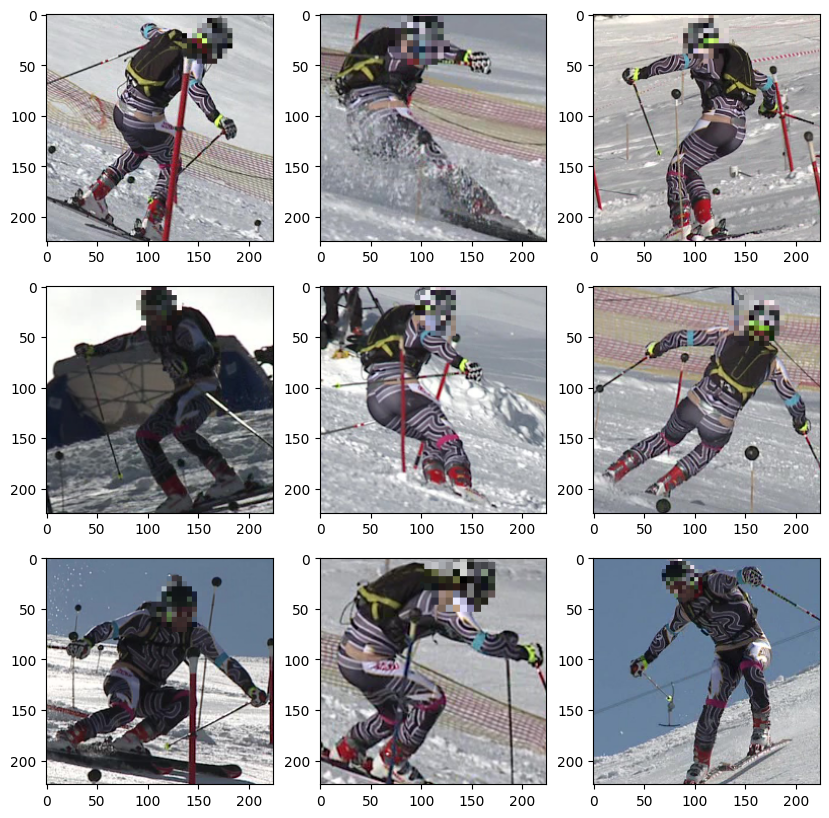

In [32]:
plot_one_cluster(cluster_set, 4, labels_proj)

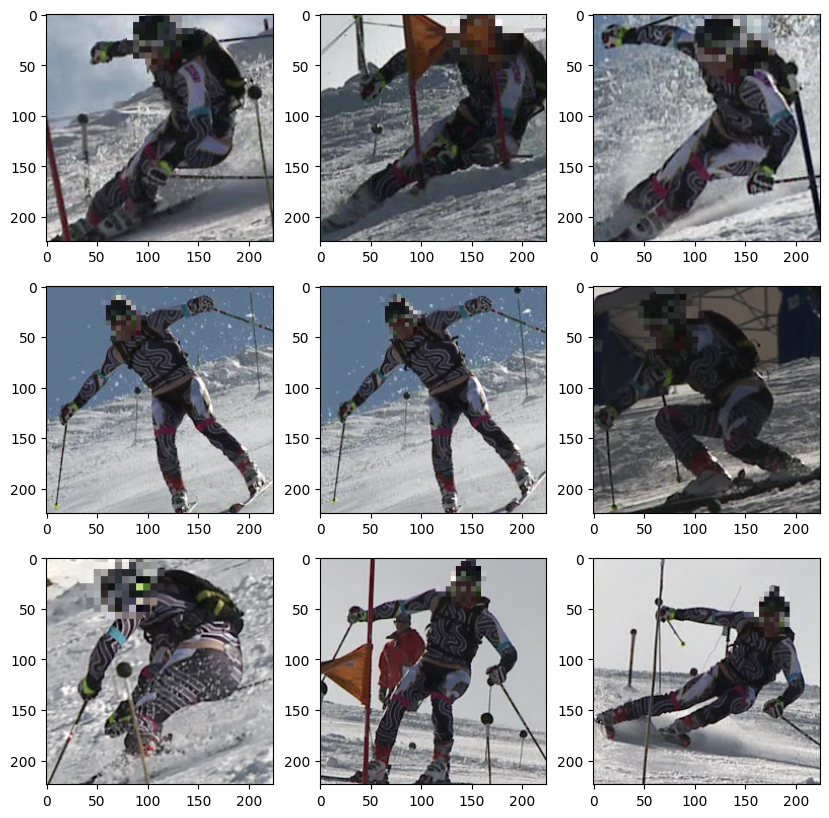

In [33]:
plot_one_cluster(cluster_set, 5, labels_proj)

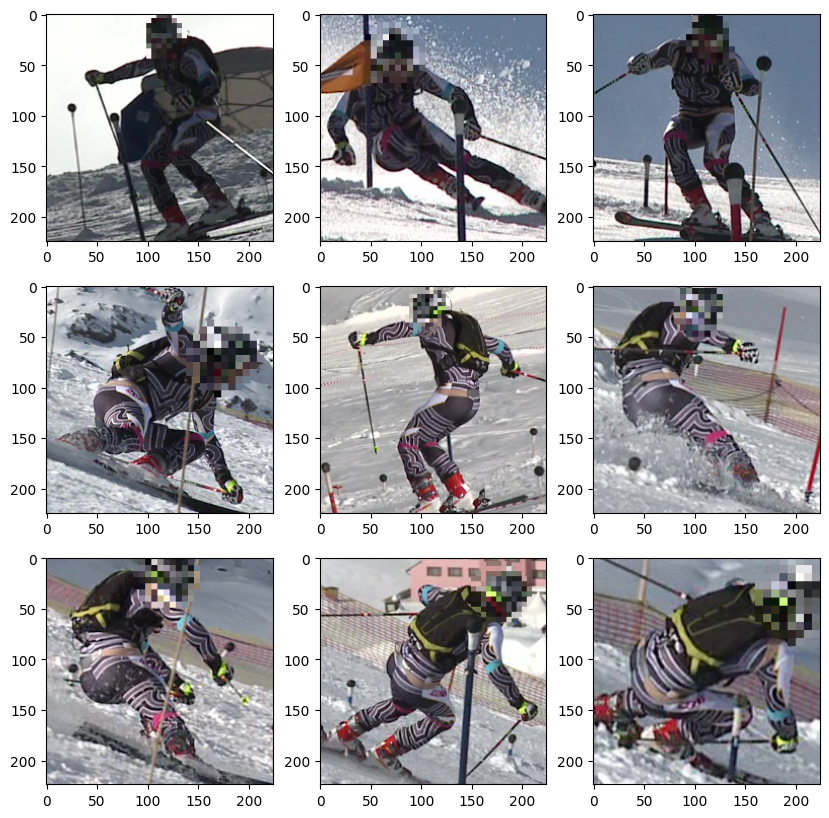

In [34]:
plot_one_cluster(cluster_set, 6, labels_proj)

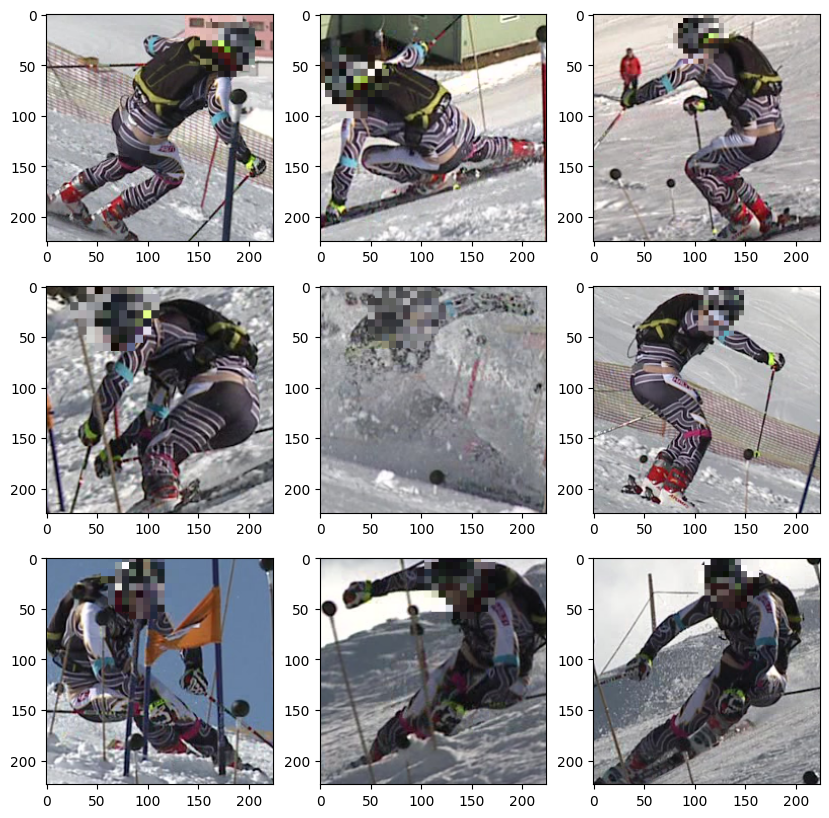

In [35]:
plot_one_cluster(cluster_set, 7, labels_proj)